In [20]:
import pickle
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [24]:
file = open('data_time_ndvi_2019.pkl','rb')
data = pickle.load(file)
time=data['time']
ndvi=np.stack(data['ndvi'],axis=0) #from a list of arrays to a numpy multidimensional array

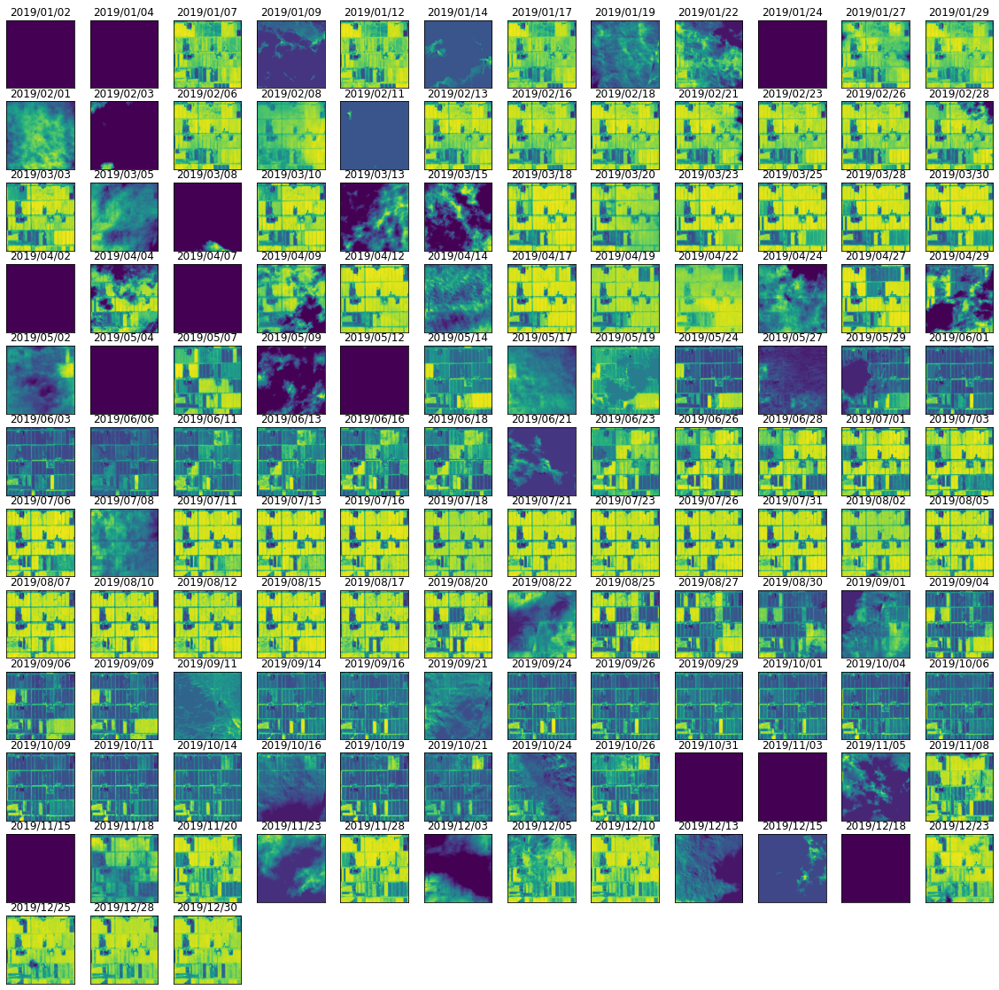

In [70]:
plt.figure(figsize=(20,20))
for t in range(len(ndvi)):
    plt.subplot(12,12,t+1)
    plt.imshow(ndvi[t])
    plt.title(time[t].strftime("%Y/%m/%d"))
    plt.tick_params(left=False,bottom=False,labelleft=False,labelbottom=False)

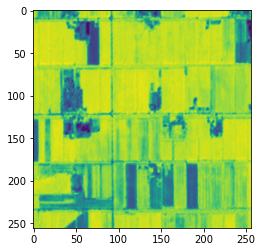

In [73]:
# Show a little animation of the time series
fig, ax = plt.subplots()
l, = ax.plot([],[])
def animate(i):
    ax.imshow(ndvi[i,:,:])
    
import matplotlib
ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(ndvi))
from IPython.display import HTML
HTML(ani.to_jshtml())

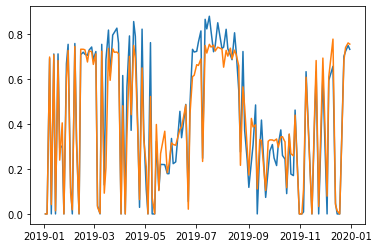

In [28]:
#plot a time an ndvi time series for a single point and for the average over all the domain
plt.plot(time,ndvi[:,128,128])
plt.plot(time,np.mean(ndvi,axis=(1,2)))

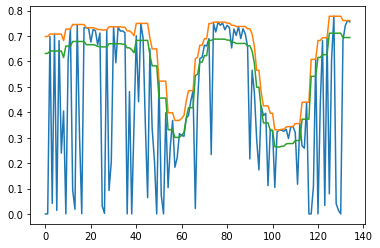

In [89]:
x=np.mean(ndvi,axis=(1,2))
#x=ndvi[:,128,128]
fin=3
xup=[]
imax=[]
nt=len(x)
for t in range(nt):
    tmin=max(0,t-fin)
    tmax=min(nt,t+fin)
    xup.append(np.max(x[tmin:tmax]))
    imax.append(tmin+np.argmax(x[tmin:tmax]))
xsd=np.sqrt(np.mean((x-xup)**2))
plt.plot(x)
plt.plot(xup)
plt.plot(xup-xsd/5)

In [ ]:
xmin=xup-xsd/5
ndvi_new=ndvi.copy()
for t in range(nt):
    if(x[t]<xmin[t]):
        ndvi_new[t]=ndvi[imax[t]]

In [108]:
xmin=xup-xsd/5
ndvi_new=ndvi.copy()
for t in range(nt):
    if(x[t]<xmin[t]): #ndvi oput of range
        tmin=max(0,t-fin)
        tmax=min(nt,t+fin)
        #print(t,imax[tmin:tmax])
        ndvi_new[t]=sum(ndvi[imax[tmin:tmax]])/len(imax[tmin:tmax])

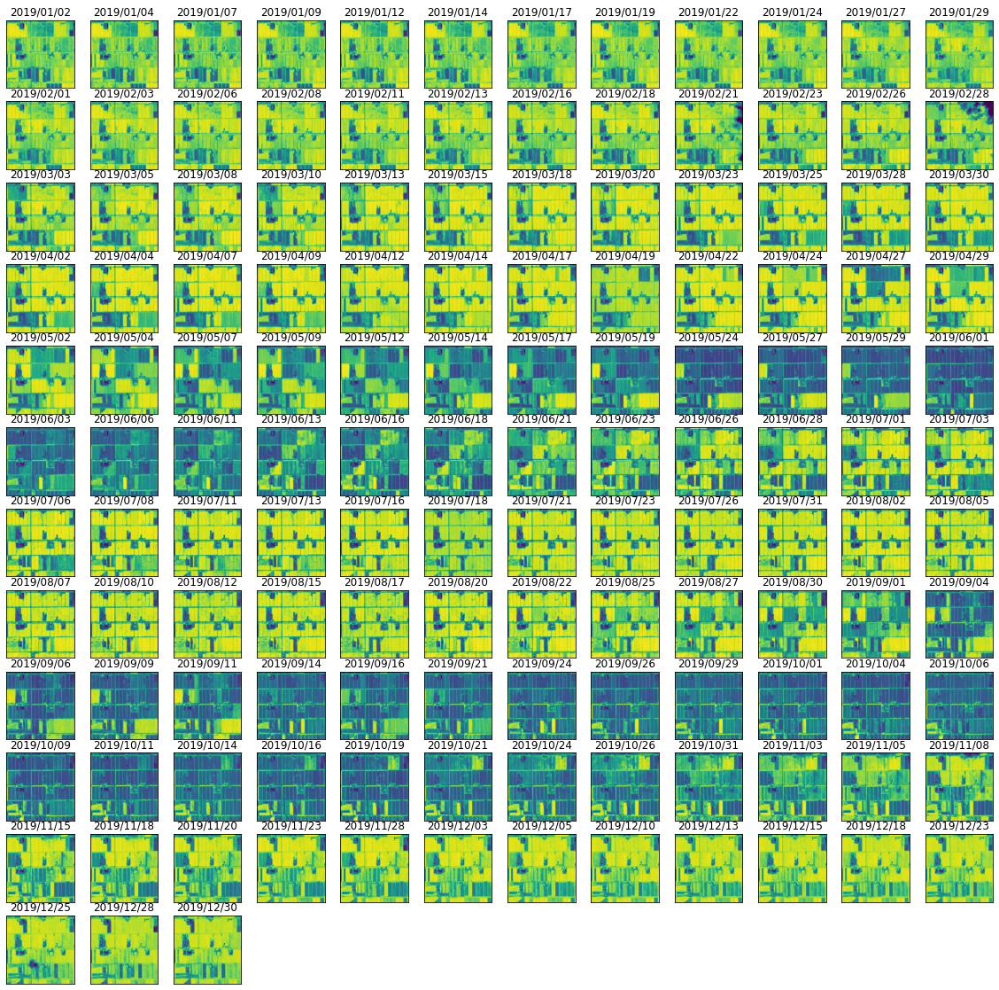

In [109]:
plt.figure(figsize=(20,20))
for t in range(len(ndvi)):
    plt.subplot(12,12,t+1)
    plt.imshow(ndvi_new[t])
    plt.title(time[t].strftime("%Y/%m/%d"))
    plt.tick_params(left=False,bottom=False,labelleft=False,labelbottom=False)

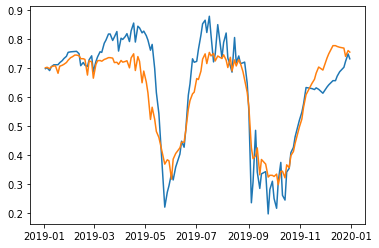

In [116]:
#plot a time an ndvi time series for a single point and for the average over all the domain
plt.plot(time,ndvi_new[:,128,128])
plt.plot(time,np.mean(ndvi_new,axis=(1,2)))